**Download the session data from Google Drive**

The necessary data is found at this link in a GDrive: [CoCo annotated data](https://drive.google.com/drive/folders/1WX1K44LV3URngyUheeGvlTR3N5TROKJb?usp=sharing). Before you proceed on, please download the data from the google drive and add to the current session in your preferred directory. The directory path needs to be changed according where the data are saved.

In [ ]:
# install dependencies: 
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 12.9 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 4.3 MB/s 
  Created wheel fo

In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 28.5 MB/s 
     |████████████████████████████████| 50 kB 2.4 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220414-py3-none-any.whl size=61211 sha256=836a5d506720508a9f475a3ff1b29d584e70a491c5eb0396f8f81bd52cd6fb37
  Stored in directory: /root/.cache/pip/wheels/df/f4/b8/7b5df8b6722f4c72315ce70c31aa693e00cef6a5056149bd28
Successfully built fvcore


In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [ ]:
import json
from detectron2.structures import BoxMode
def get_board_dicts(imgdir):
    json_file = imgdir+"/dataset.json" #Fetch the json file
    with open(json_file) as f:
        dataset_dicts = json.load(f)
    for i in dataset_dicts:
        filename = i["file_name"] 
        i["file_name"] = imgdir+"/"+filename 
        for j in i["annotations"]:
            j["bbox_mode"] = BoxMode.XYWH_ABS #Setting the required Box Mode
            j["category_id"] = int(j["category_id"])
    return dataset_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog

**Registering the Dataset**

The dataset now needs to be registered with Detectron2. To do that, one may need to change the directory path in the below code block according to their directory path.

In [ ]:
#Registering the Dataset, Change directory path if needed
for d in ["train", "test"]:
    DatasetCatalog.register("boardetect_" + d, lambda d=d: get_board_dicts("/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/" + d))
    MetadataCatalog.get("boardetect_" + d).set(thing_classes=["None","pneumonia","backbone"])
board_metadata = MetadataCatalog.get("boardetect_train")

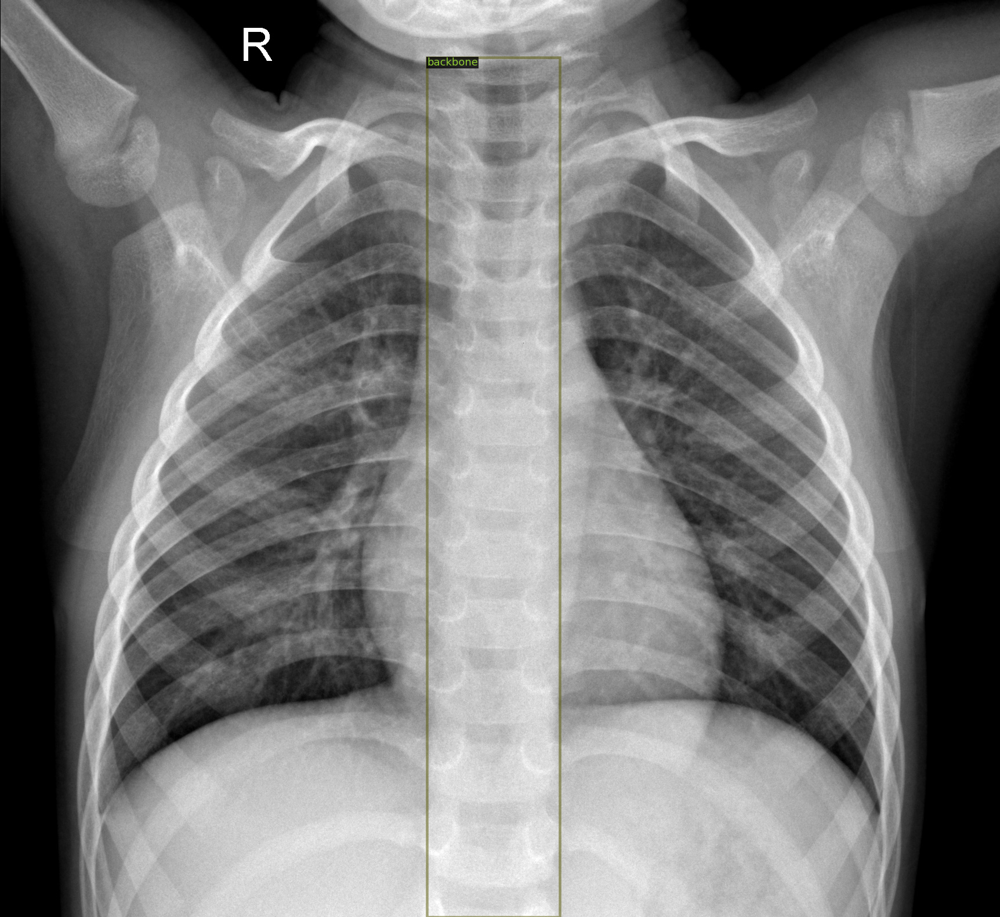

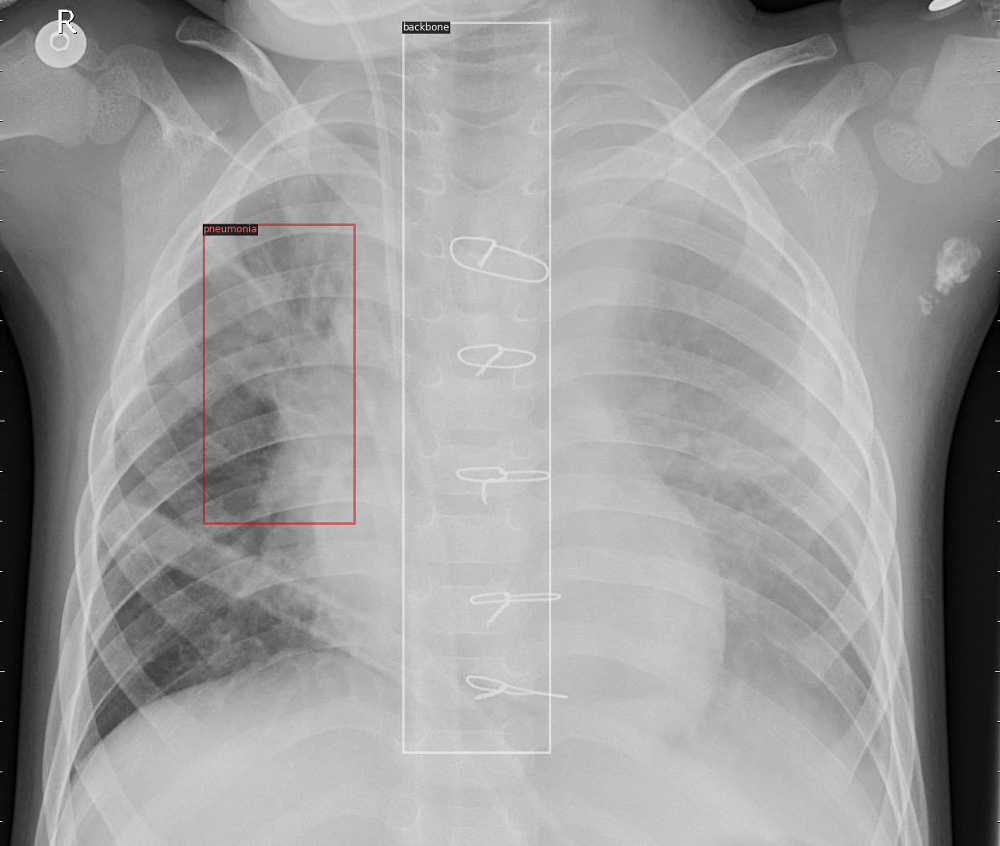

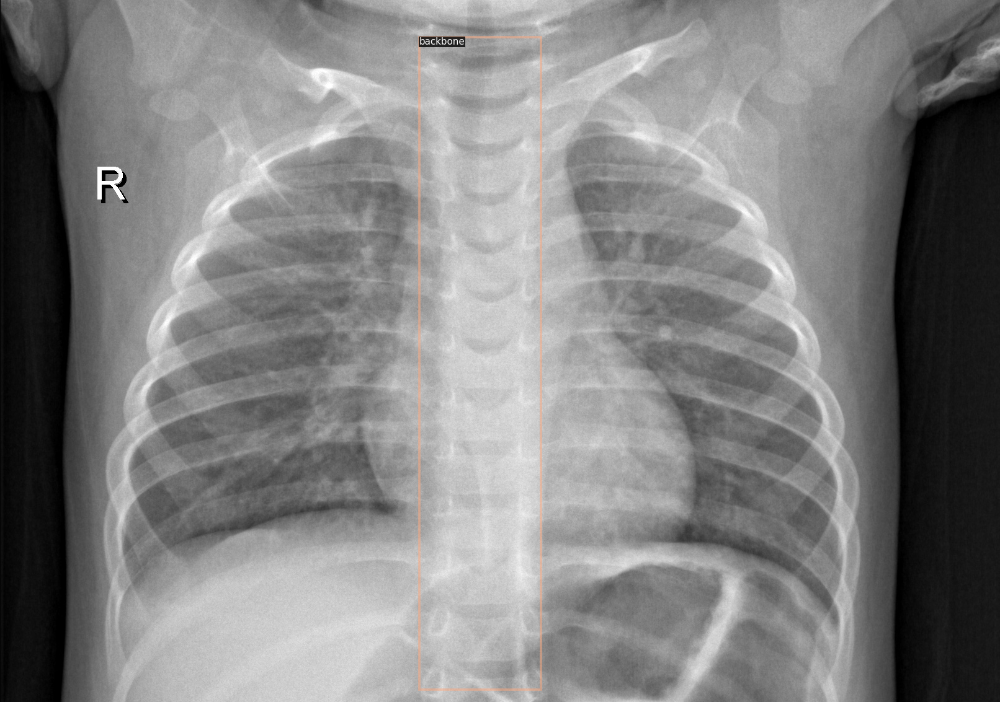

In [ ]:
#Visualizing the Train Dataset, change the directory according your path to directory

dataset_dicts = get_board_dicts("/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/train")
#Randomly choosing 3 images from the Set
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=board_metadata)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])
    

In [ ]:
from detectron2.evaluation import evaluator
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")) #Get the basic model configuration from the model zoo 
#Passing the Train and Validation sets
cfg.DATASETS.TRAIN = ("boardetect_train",)
cfg.DATASETS.TEST = ("boardetect_test",)

# Number of data loading threads
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo

# Number of images per batch across all machines.
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LearningRate
cfg.SOLVER.MAX_ITER = 500  #No. of iterations   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 # No. of classes = [None, pneumonia, backbone]
cfg.TEST.EVAL_PERIOD = 100 # No. of iterations after which the Validation Set is evaluated. 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/20 05:00:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[04/20 05:00:25 d2.engine.train_loop]: Starting training from iteration 0
[04/20 05:00:51 d2.utils.events]:  eta: 0:10:08  iter: 19  total_loss: 1.178  loss_cls: 1.009  loss_box_reg: 0.050  loss_rpn_cls: 0.057  loss_rpn_loc: 0.048  time: 1.2742  data_time: 0.0473  lr: 0.000250  max_mem: 4534M
[04/20 05:01:15 d2.utils.events]:  eta: 0:09:32  iter: 39  total_loss: 0.348  loss_cls: 0.173  loss_box_reg: 0.113  loss_rpn_cls: 0.022  loss_rpn_loc: 0.019  time: 1.2346  data_time: 0.0095  lr: 0.000500  max_mem: 4534M
[04/20 05:01:39 d2.utils.events]:  eta: 0:08:54  iter: 59  total_loss: 0.371  loss_cls: 0.179  loss_box_reg: 0.168  loss_rpn_cls: 0.017  loss_rpn_loc: 0.019  time: 1.2185  data_time: 0.0084  lr: 0.000749  max_mem: 4534M
[04/20 05:02:04 d2.utils.events]:  eta: 0:08:40  iter: 79  total_loss: 0.362  loss_cls: 0.155  loss_box_reg: 0.171  loss_rpn_cls: 0.009  loss_rpn_loc: 0.019  time: 1.2350  data_time: 0.0079  lr: 0.000999  max_mem: 4625M
[04/20 05:02:29 d2.data.common]: Serializing 8

**Prediction on Test Dataset**

Change the path to test data directory, if required.

/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test/60.jpeg


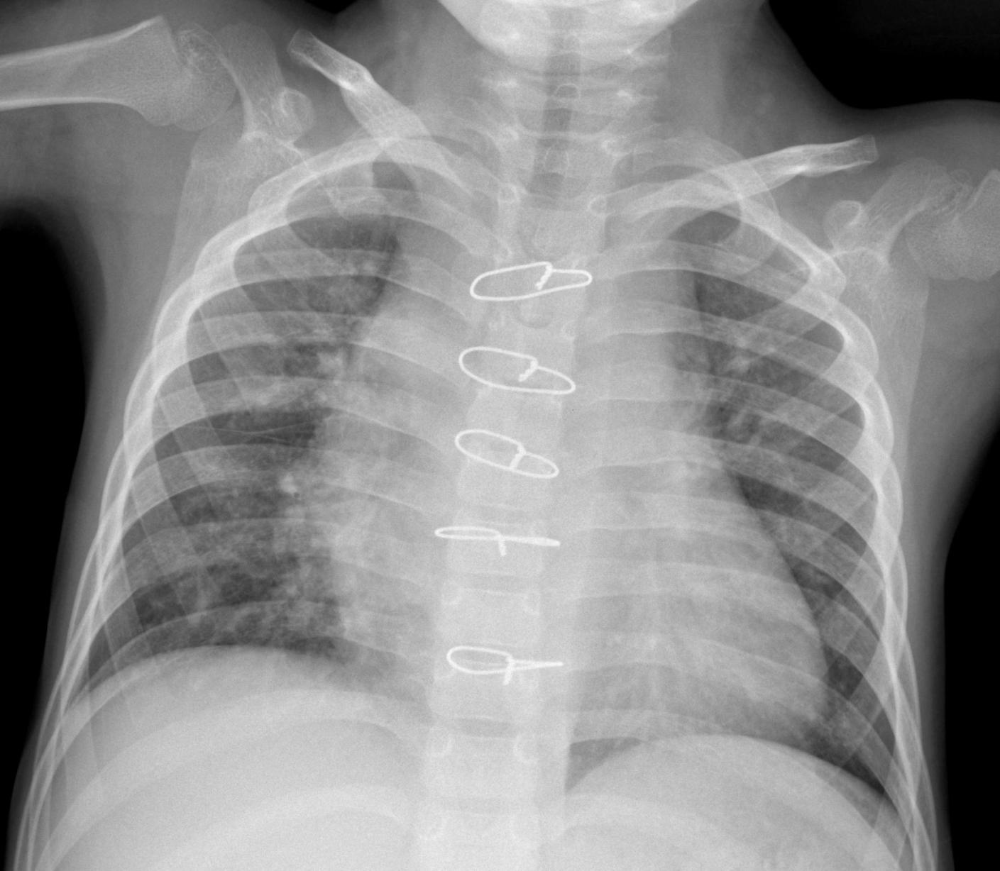

/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test/57.jpeg


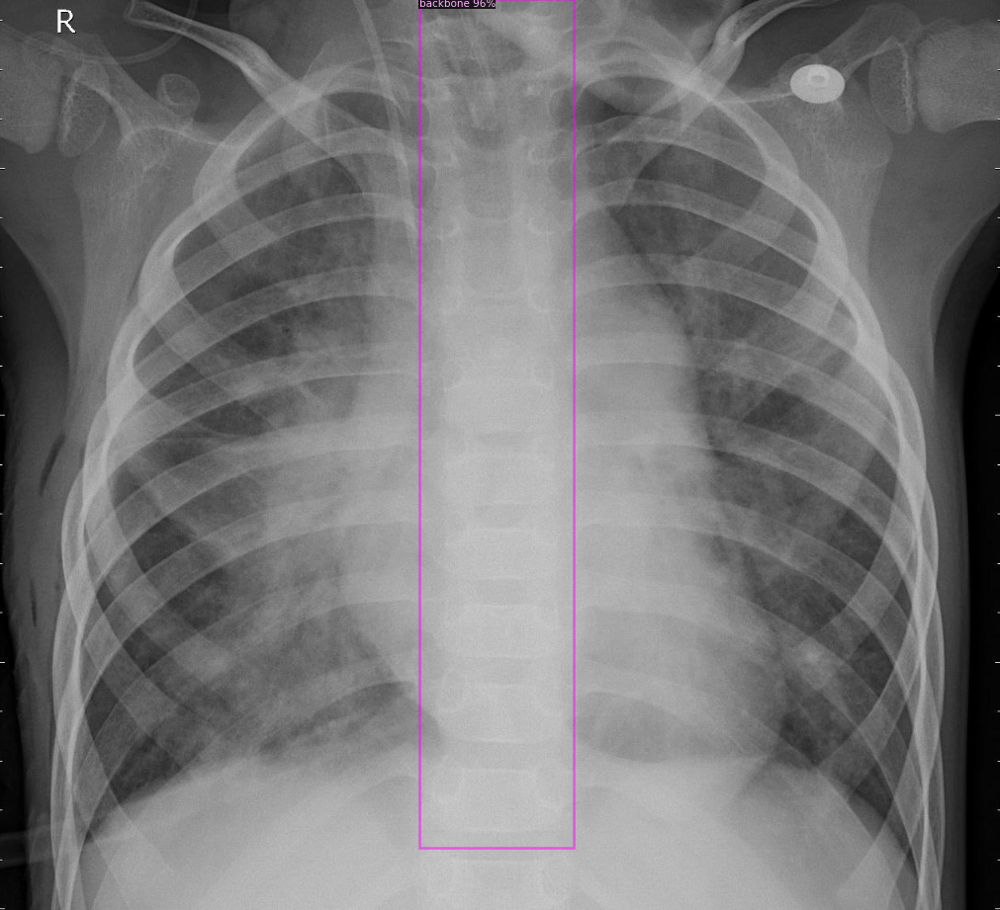

/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test/58.jpeg


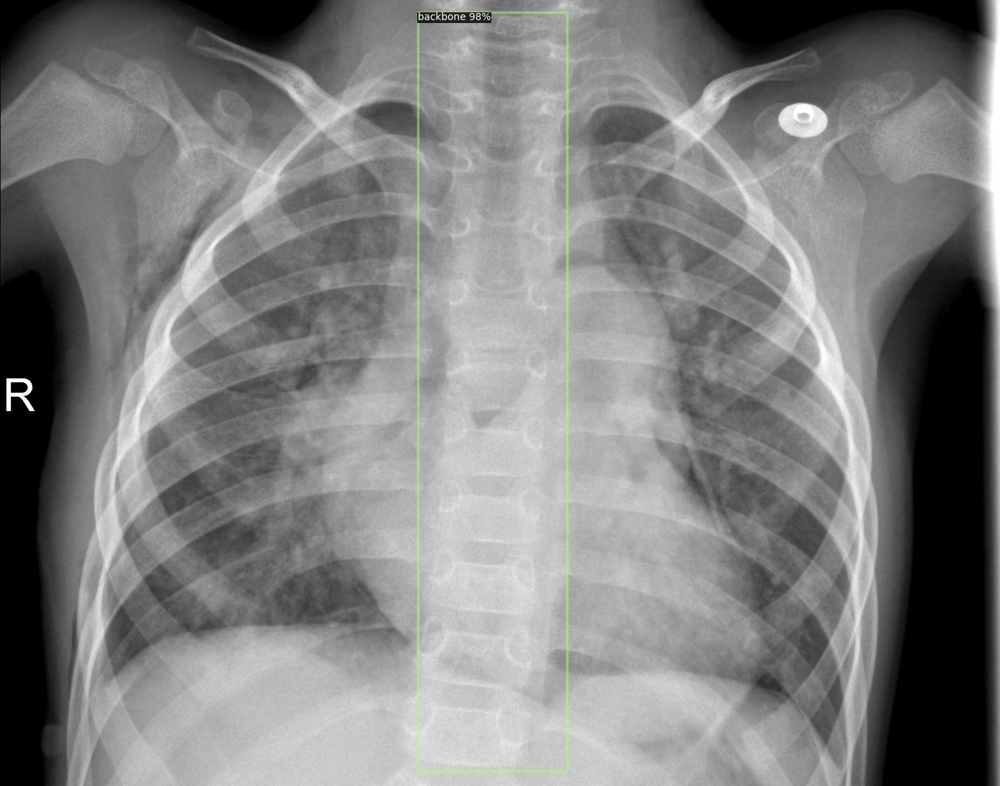

/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test/2.jpeg


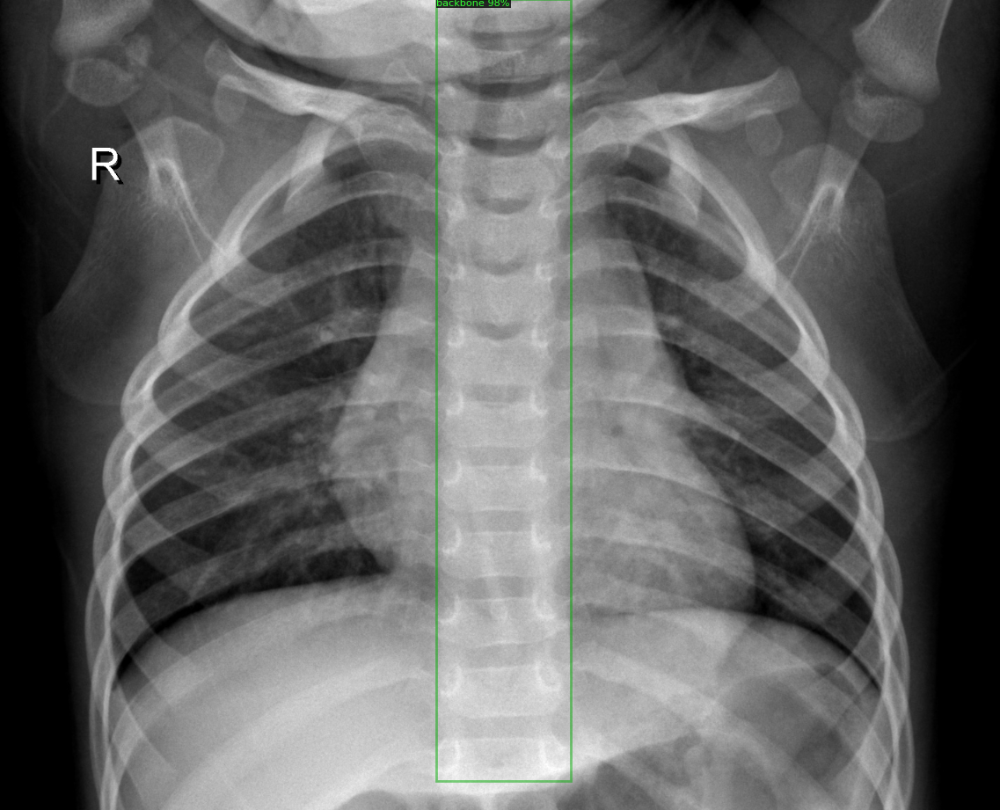

/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test/4.jpeg


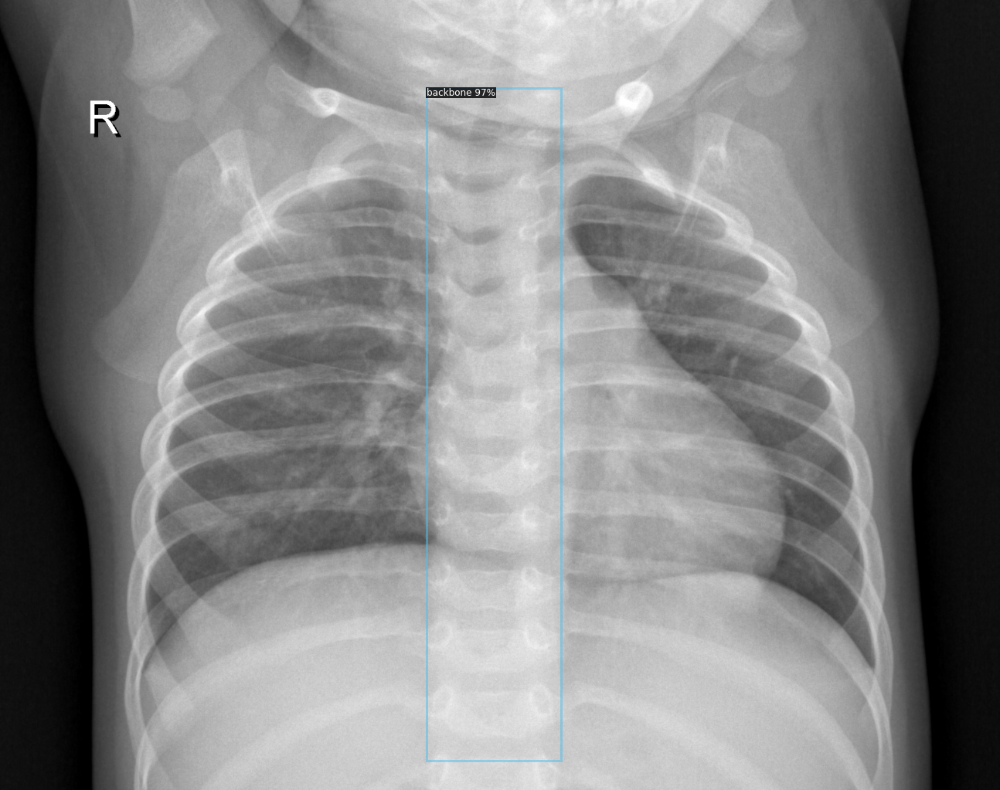

/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test/1.jpeg


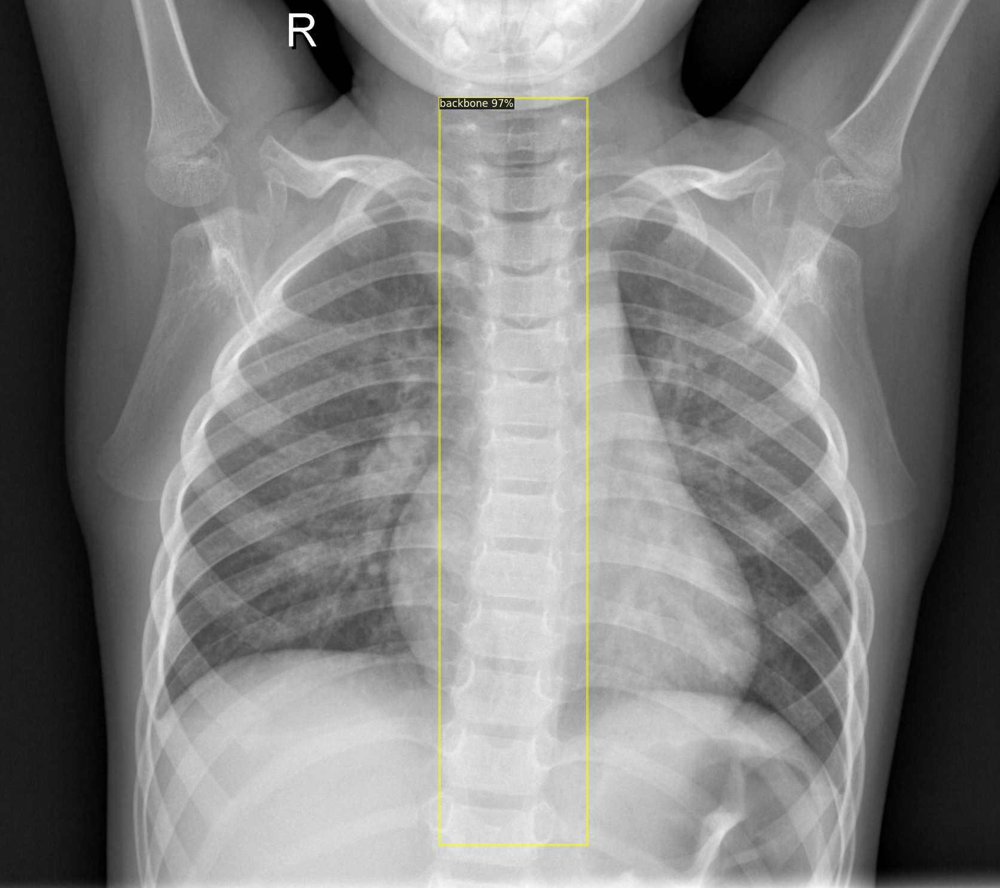

/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test/3.jpeg


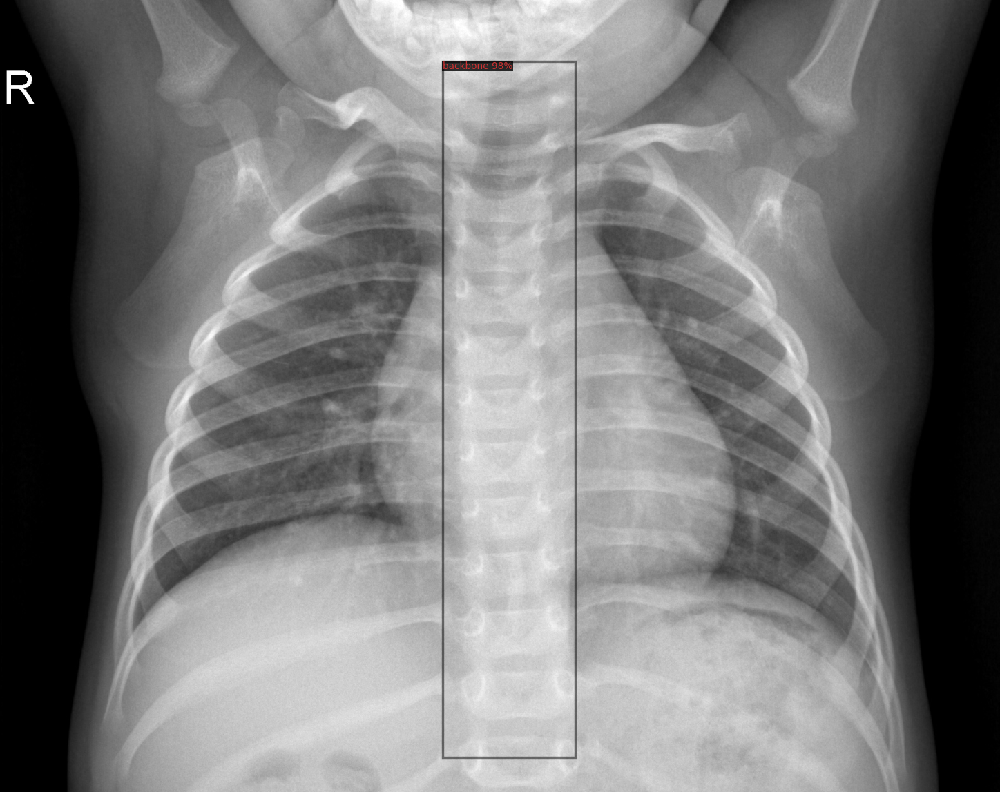

/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test/59.jpeg


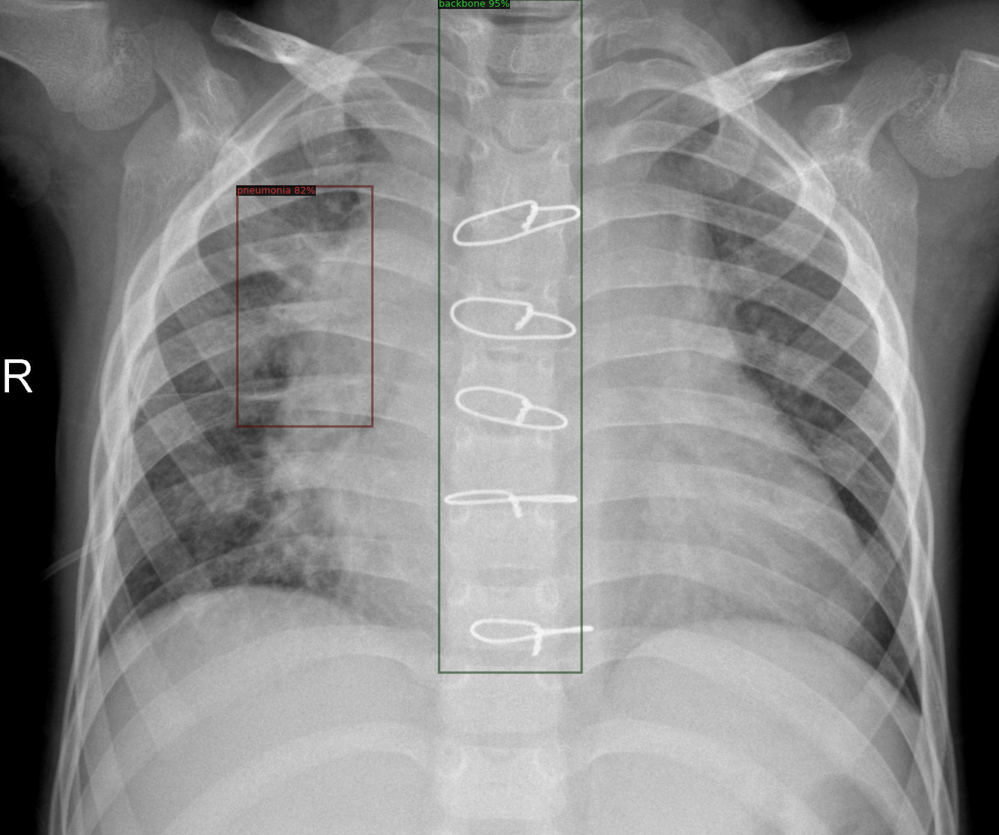

In [ ]:
from detectron2.utils.visualizer import ColorMode

#Use the final weights generated after successful training for inference  
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set the testing threshold for this model
#Pass the validation dataset
cfg.DATASETS.TEST = ("boardetect_test")

predictor = DefaultPredictor(cfg)

#Change path to directory if necessary
dataset_dicts = get_board_dicts("/content/drive/MyDrive/CMPUT615/Text_Detection_Dataset_COCO_Format/test")
for d in dataset_dicts:
    print(d["file_name"])    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=board_metadata, 
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE   
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu")) #Passing the predictions to CPU from the GPU
    cv2_imshow(v.get_image()[:, :, ::-1])